In [36]:
import pandas as pd
import seaborn as sns

In [23]:
uber=pd.read_csv(r'/Users/helmichaaba/Downloads/uber-raw-data-may14.csv')
uber

,Date/Time,Lat,Lon,Base
0,5/1/2014 0:02:00,40.7521,-73.9914,B02512
1,5/1/2014 0:06:00,40.6965,-73.9715,B02512
2,5/1/2014 0:15:00,40.7464,-73.9838,B02512
3,5/1/2014 0:17:00,40.7463,-74.0011,B02512
4,5/1/2014 0:17:00,40.7594,-73.9734,B02512
...,...,...,...,...
652430,5/31/2014 23:45:00,40.7309,-74.0014,B02764
652431,5/31/2014 23:52:00,40.7528,-73.9798,B02764
652432,5/31/2014 23:55:00,40.7158,-73.9519,B02764
652433,5/31/2014 23:56:00,40.6961,-73.8997,B02764


In [24]:
uber.head()

,Date/Time,Lat,Lon,Base
0,5/1/2014 0:02:00,40.7521,-73.9914,B02512
1,5/1/2014 0:06:00,40.6965,-73.9715,B02512
2,5/1/2014 0:15:00,40.7464,-73.9838,B02512
3,5/1/2014 0:17:00,40.7463,-74.0011,B02512
4,5/1/2014 0:17:00,40.7594,-73.9734,B02512


In [25]:
uber.tail()

,Date/Time,Lat,Lon,Base
652430,5/31/2014 23:45:00,40.7309,-74.0014,B02764
652431,5/31/2014 23:52:00,40.7528,-73.9798,B02764
652432,5/31/2014 23:55:00,40.7158,-73.9519,B02764
652433,5/31/2014 23:56:00,40.6961,-73.8997,B02764
652434,5/31/2014 23:59:00,40.7393,-73.9919,B02764


In [26]:
uber.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

In [27]:
uber.columns

Index(['Date/Time', 'Lat', 'Lon', 'Base'], dtype='object')

In [28]:
uber.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [29]:
uber['Date/Time'] = uber['Date/Time'].map(pd.to_datetime)

In [30]:
def get_dom(dt):
    return dt.day

uber['dom'] = uber['Date/Time'].map(get_dom)

In [32]:
def get_weekday(dt):
    return dt.weekday()

uber['weekday'] = uber['Date/Time'].map(get_weekday)

def get_hour(dt):
    return dt.hour

uber['hour'] = uber['Date/Time'].map(get_hour)

uber.head()

,Date/Time,Lat,Lon,Base,dom,weekday,hour
0,2014-05-01 00:02:00,40.7521,-73.9914,B02512,1,3,0
1,2014-05-01 00:06:00,40.6965,-73.9715,B02512,1,3,0
2,2014-05-01 00:15:00,40.7464,-73.9838,B02512,1,3,0
3,2014-05-01 00:17:00,40.7463,-74.0011,B02512,1,3,0
4,2014-05-01 00:17:00,40.7594,-73.9734,B02512,1,3,0


In [34]:
uber.tail()

,Date/Time,Lat,Lon,Base,dom,weekday,hour
652430,2014-05-31 23:45:00,40.7309,-74.0014,B02764,31,5,23
652431,2014-05-31 23:52:00,40.7528,-73.9798,B02764,31,5,23
652432,2014-05-31 23:55:00,40.7158,-73.9519,B02764,31,5,23
652433,2014-05-31 23:56:00,40.6961,-73.8997,B02764,31,5,23
652434,2014-05-31 23:59:00,40.7393,-73.9919,B02764,31,5,23


In [35]:
uber.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dom                   int64
weekday               int64
hour                  int64
dtype: object

In [38]:
import matplotlib.pyplot as plt

[Text(0.5, 1.0, 'Frequency by DoM - uber - May'),
 Text(0.5, 0, 'date of the month'),
 Text(0, 0.5, 'Frequency')]

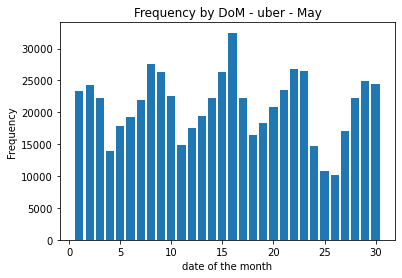

In [47]:
x = uber.dom
plt.hist(x, bins=30, rwidth = .8, range = (0.5, 30.5))
plt.gca().set(title='Frequency by DoM - uber - May',xlabel='date of the month' ,ylabel='Frequency')

Text(0, 0.5, 'Frequency')

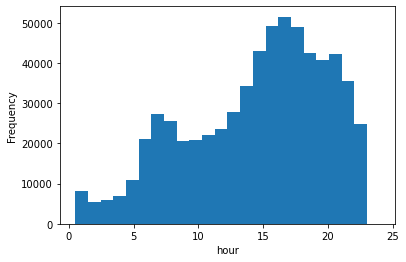

In [51]:
plt.hist(uber.hour, bins = 24, range = (.5, 24))
plt.xlabel('hour')
plt.ylabel('Frequency')

Text(0.5, 1.0, 'Frequency of use by day')

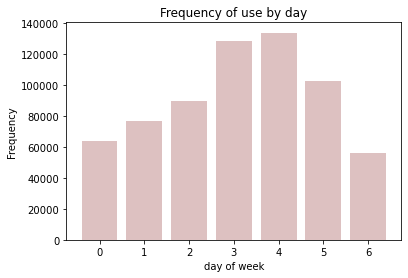

In [61]:
plt.hist(uber.weekday, bins = 7, range= (-.5, 6.5), rwidth = .8, color = '#AA6666', alpha= .4)
xticks=(range(7), 'Mon, Tue, Wed, Fri, Sat, Sun'.split())
plt.xlabel('day of week')
plt.ylabel('Frequency')
plt.title('Frequency of use by day')

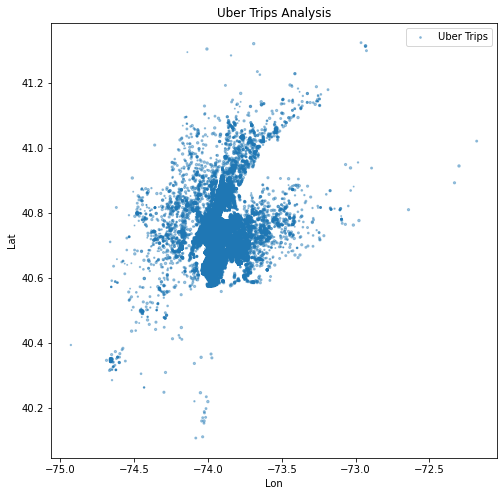

In [63]:
uber.plot(kind='scatter', x='Lon', y='Lat', alpha=0.4, s=uber['weekday'], label='Uber Trips',
figsize=(8, 8), cmap=plt.get_cmap('jet'))
plt.title("Uber Trips Analysis")
plt.legend()
plt.show()

<AxesSubplot:xlabel='hour', ylabel='weekday'>

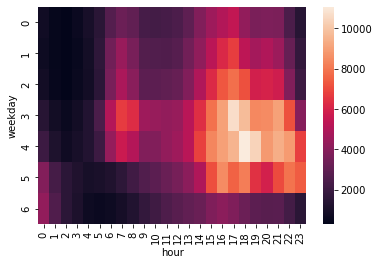

In [49]:
df = uber.groupby(["weekday", "hour"]).apply(lambda x: len(x))
df = df.unstack()
sns.heatmap(df, annot=False)

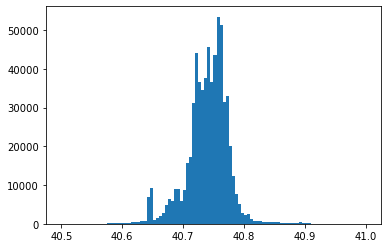

In [67]:
plt.hist(uber['Lat'], bins = 100, range = (40.5, 41));


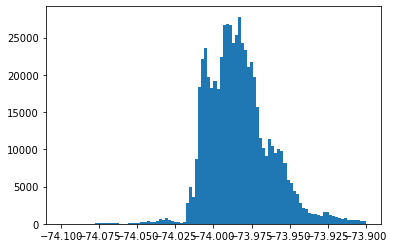

In [69]:
plt.hist(uber['Lon'], bins = 100, range = (-74.1, -73.9));

In [71]:
x = uber.iloc[:,1:3]
x

,Lat,Lon
0,40.7521,-73.9914
1,40.6965,-73.9715
2,40.7464,-73.9838
3,40.7463,-74.0011
4,40.7594,-73.9734
...,...,...
652430,40.7309,-74.0014
652431,40.7528,-73.9798
652432,40.7158,-73.9519
652433,40.6961,-73.8997


In [94]:
uber['BinnedHour']=uber['Date/Time'].dt.floor('15min')
uber['BinnedHour']

0        2014-05-01 00:00:00
1        2014-05-01 00:00:00
2        2014-05-01 00:15:00
3        2014-05-01 00:15:00
4        2014-05-01 00:15:00
                 ...        
652430   2014-05-31 23:45:00
652431   2014-05-31 23:45:00
652432   2014-05-31 23:45:00
652433   2014-05-31 23:45:00
652434   2014-05-31 23:45:00
Name: BinnedHour, Length: 652435, dtype: datetime64[ns]

In [95]:
uber['BinnedHour'].value_counts()

2014-05-16 19:45:00    908
2014-05-16 21:00:00    837
2014-05-16 19:00:00    789
2014-05-16 21:15:00    782
2014-05-16 21:30:00    734
                      ... 
2014-05-07 02:15:00     13
2014-05-27 02:15:00     12
2014-05-05 02:30:00     11
2014-05-05 02:00:00     11
2014-05-05 02:15:00      9
Name: BinnedHour, Length: 2976, dtype: int64

In [120]:
data_sample=x.sample(int(x.shape[0]*0.01))
data_sample.shape

(6524, 2)

In [137]:
#K_MEANS

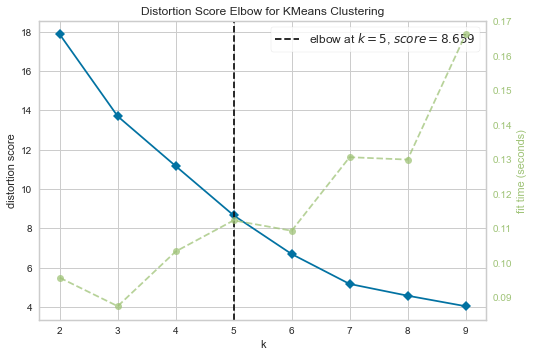

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [122]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
model = KMeans()
visualizer = KElbowVisualizer(estimator = model, k = (2,10))
visualizer.fit(data_sample)
visualizer.poof()

In [134]:
kmeans = KMeans(5)
kmeans.fit_predict(data_sample)

array([3, 1, 1, ..., 1, 1, 0], dtype=int32)

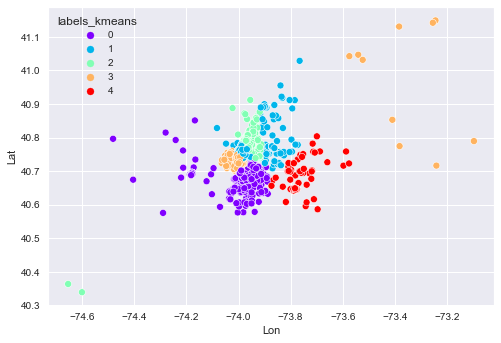

In [136]:
data_sample['labels_kmeans'] = kmeans.labels_
sns.set_style('darkgrid')
sns.scatterplot(data=data_sample, x='Lon', y='Lat', hue='labels_kmeans', palette='rainbow')
plt.show()

In [96]:
import folium

In [167]:
data_map_list_cluster1 = data_sample[['Lat','Lon']][data_sample['labels_kmeans']==0].values.tolist()
data_map_list_cluster2 = data_sample[['Lat','Lon']][data_sample['labels_kmeans']==1].values.tolist()
data_map_list_cluster3 = data_sample[['Lat','Lon']][data_sample['labels_kmeans']==2].values.tolist()
data_map_list_cluster4 = data_sample[['Lat','Lon']][data_sample['labels_kmeans']==3].values.tolist()
data_map_list_cluster5 = data_sample[['Lat','Lon']][data_sample['labels_kmeans']==4].values.tolist()
data_map_list_cluster6 = data_sample[['Lat','Lon']][data_sample['labels_kmeans']==5].values.tolist()
data_map_list_cluster7 = data_sample[['Lat','Lon']][data_sample['labels_kmeans']==6].values.tolist()
size_map_list_1 = len(data_map_list_cluster1)
size_map_list_2 = len(data_map_list_cluster2)
size_map_list_3 = len(data_map_list_cluster3)
size_map_list_4 = len(data_map_list_cluster4)
size_map_list_5 = len(data_map_list_cluster5)
size_map_list_6 = len(data_map_list_cluster6)
size_map_list_7 = len(data_map_list_cluster7)

In [188]:
m_p= folium.Map(location=[40.7128, -74.0060], zoom_start=20,tiles = "openstreetmap")
for point in range(0,size_map_list_1):
    folium.CircleMarker(data_map_list_cluster1[point], radius=2,color='blue',fill_color='lightblue',).add_to(m_p)
for point in range(0,size_map_list_2):
    folium.CircleMarker(data_map_list_cluster2[point], radius=2,color='green',fill_color='lightgreen',).add_to(m_p)
for point in range(0,size_map_list_3):
    folium.CircleMarker(data_map_list_cluster3[point], radius=2,color='purple',fill_color='purple',).add_to(m_p)
for point in range(0,size_map_list_4):
    folium.CircleMarker(data_map_list_cluster4[point], radius=2,color='orange',fill_color='orange',).add_to(m_p)
for point in range(0,size_map_list_5):
    folium.CircleMarker(data_map_list_cluster5[point], radius=2,color='red',fill_color='red',).add_to(m_p)
for point in range(0,size_map_list_6):
    folium.CircleMarker(data_map_list_cluster6[point], radius=2,color='violet',fill_color='violet',).add_to(m_p)
for point in range(0,size_map_list_7):
    folium.CircleMarker(data_map_list_cluster7[point], radius=2,color='brown',fill_color='brown',).add_to(m_p)
m_p

In [ ]:
#DBSCAN

In [138]:
from sklearn.cluster import DBSCAN

cluster = DBSCAN(eps=0.5)
model = cluster.fit(data_sample)

In [140]:
# Your code here
data_sample['labels_DBSCAN']=model.labels_
data_sample.labels_DBSCAN.value_counts()

 1    2410
 0    2343
 2     810
 3     751
 4     198
 5      10
-1       2
Name: labels_DBSCAN, dtype: int64

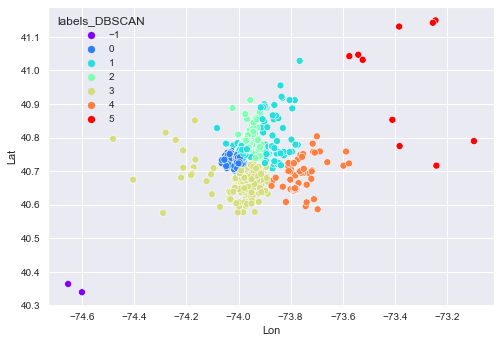

In [141]:
data_sample['labels_DBSCAN'] = model.labels_
sns.set_style('darkgrid')
sns.scatterplot(data=data_sample, x='Lon', y='Lat', hue='labels_DBSCAN', palette='rainbow')
plt.show()

In [186]:
data_map_list_cluster1 = data_sample[['Lat','Lon']][data_sample['labels_DBSCAN']==-1].values.tolist()
data_map_list_cluster2 = data_sample[['Lat','Lon']][data_sample['labels_DBSCAN']==0].values.tolist()
data_map_list_cluster3 = data_sample[['Lat','Lon']][data_sample['labels_DBSCAN']==1].values.tolist()
data_map_list_cluster4 = data_sample[['Lat','Lon']][data_sample['labels_DBSCAN']==2].values.tolist()
data_map_list_cluster5 = data_sample[['Lat','Lon']][data_sample['labels_DBSCAN']==3].values.tolist()
data_map_list_cluster6 = data_sample[['Lat','Lon']][data_sample['labels_DBSCAN']==4].values.tolist()
data_map_list_cluster7 = data_sample[['Lat','Lon']][data_sample['labels_DBSCAN']==5].values.tolist()
size_map_list_1 = len(data_map_list_cluster1)
size_map_list_2 = len(data_map_list_cluster2)
size_map_list_3 = len(data_map_list_cluster3)
size_map_list_4 = len(data_map_list_cluster4)
size_map_list_5 = len(data_map_list_cluster5)
size_map_list_6 = len(data_map_list_cluster6)
size_map_list_7 = len(data_map_list_cluster7)

In [189]:
m_p= folium.Map(location=[40.7128, -74.0060], zoom_start=20,tiles = "openstreetmap")
for point in range(0,size_map_list_1):
    folium.CircleMarker(data_map_list_cluster1[point], radius=2,color='blue',fill_color='lightblue',).add_to(m_p)
for point in range(0,size_map_list_2):
    folium.CircleMarker(data_map_list_cluster2[point], radius=2,color='green',fill_color='lightgreen',).add_to(m_p)
for point in range(0,size_map_list_3):
    folium.CircleMarker(data_map_list_cluster3[point], radius=2,color='purple',fill_color='purple',).add_to(m_p)
for point in range(0,size_map_list_4):
    folium.CircleMarker(data_map_list_cluster4[point], radius=2,color='orange',fill_color='orange',).add_to(m_p)
for point in range(0,size_map_list_5):
    folium.CircleMarker(data_map_list_cluster5[point], radius=2,color='red',fill_color='red',).add_to(m_p)
for point in range(0,size_map_list_6):
    folium.CircleMarker(data_map_list_cluster6[point], radius=2,color='violet',fill_color='violet',).add_to(m_p)
for point in range(0,size_map_list_7):
    folium.CircleMarker(data_map_list_cluster7[point], radius=2,color='brown',fill_color='brown',).add_to(m_p)
m_p

In [ ]:
#SpectralClustering

In [169]:
from sklearn.cluster import SpectralClustering

In [173]:
clustering = SpectralClustering(n_clusters=5,assign_labels='discretize',random_state=0).fit(data_sample)


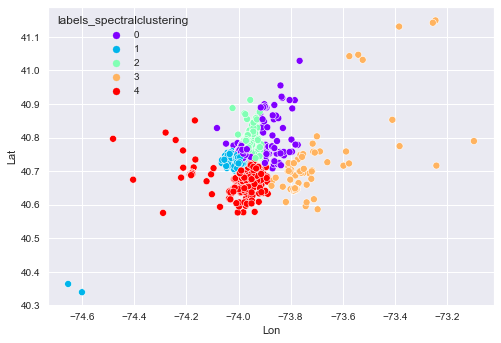

In [175]:
data_sample['labels_spectralclustering'] = clustering.labels_
sns.set_style('darkgrid')
sns.scatterplot(data=data_sample, x='Lon', y='Lat', hue='labels_spectralclustering', palette='rainbow')
plt.show()

In [191]:
data_map_list_cluster1 = data_sample[['Lat','Lon']][data_sample['labels_spectralclustering']==0].values.tolist()
data_map_list_cluster2 = data_sample[['Lat','Lon']][data_sample['labels_spectralclustering']==1].values.tolist()
data_map_list_cluster3 = data_sample[['Lat','Lon']][data_sample['labels_spectralclustering']==2].values.tolist()
data_map_list_cluster4 = data_sample[['Lat','Lon']][data_sample['labels_spectralclustering']==3].values.tolist()
data_map_list_cluster5 = data_sample[['Lat','Lon']][data_sample['labels_spectralclustering']==4].values.tolist()

size_map_list_1 = len(data_map_list_cluster1)
size_map_list_2 = len(data_map_list_cluster2)
size_map_list_3 = len(data_map_list_cluster3)
size_map_list_4 = len(data_map_list_cluster4)
size_map_list_5 = len(data_map_list_cluster5)


In [194]:
m_p= folium.Map(location=[40.7128, -74.0060], zoom_start=20,tiles = "openstreetmap")
for point in range(0,size_map_list_1):
    folium.CircleMarker(data_map_list_cluster1[point], radius=2,color='blue',fill_color='lightblue',).add_to(m_p)
for point in range(0,size_map_list_2):
    folium.CircleMarker(data_map_list_cluster2[point], radius=2,color='green',fill_color='lightgreen',).add_to(m_p)
for point in range(0,size_map_list_3):
    folium.CircleMarker(data_map_list_cluster3[point], radius=2,color='purple',fill_color='purple',).add_to(m_p)
for point in range(0,size_map_list_4):
    folium.CircleMarker(data_map_list_cluster4[point], radius=2,color='orange',fill_color='orange',).add_to(m_p)
for point in range(0,size_map_list_5):
    folium.CircleMarker(data_map_list_cluster5[point], radius=2,color='red',fill_color='red',).add_to(m_p)
m_p